In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import pycountry

from pandas import CategoricalDtype
from bs4 import BeautifulSoup
from datetime import date
from scipy import stats
from folium.plugins import HeatMap
import plotly.express as px

import sys
import os

Описание набора данных о землетрясениях (1990-2023 гг.)

Набор данных о землетрясениях представляет собой обширную коллекцию данных, содержащую информацию обо всех землетрясениях, зарегистрированных во всем мире с 1990 по 2023 год. Набор данных состоит примерно из трех миллионов строк, каждая из которых представляет конкретное землетрясение. Каждая запись в наборе данных содержит набор соответствующих атрибутов, связанных с землетрясением, таких как дата и время события, географическое положение (широта и долгота), магнитуда землетрясения, глубина эпицентра, тип землетрясения. величина, используемая для измерения, затронутый регион и другая соответствующая информация.

Описание датасета:
- time - время в милисекундах.
- place - географическое положение.
- status - представляет текущее состояние или условие события, которое может быть просмотрено или автоматически определено.
- tsunami (boolean value) - относится к серии больших океанских волн, обычно вызываемых подводными волнениями, часто связанными с землетрясениями.
- significance - обозначает важность или уровень воздействия события, которое можно использовать для оценки потенциальных последствий.
- data_type - указывает тип данных.
- magnitudo - относится к измерению размера или интенсивности землетрясения, обычно измеряемого по шкале Рихтера.
- state - представляет административную единицу или штат, где произошло событие.
- longitude - долгота.
- latitude - широта.
- depth - глубина землетрясения.
- date - дата и время землетрясения.

In [5]:
df = pd.read_csv('../data/Earthquakes-1990-2023.csv')

In [6]:
# берем сэмпл 100 000 строк
df = df[-100000:]

In [7]:
# просмотр датасета
df[:5]

,time,place,status,tsunami,significance,data_type,magnitude,state,longitude,latitude,depth,date
3345751,1668773163070,"14 km SSE of Eden Roc, Hawaii",automatic,0,58,earthquake,1.94,Hawaii,-155.030334,19.374001,7.10,2022-11-18 12:06:03.070000+00:00
3345752,1668773284487,"40 km ESE of Nikolski, Alaska",reviewed,0,62,earthquake,2.00,Alaska,-168.310800,52.786100,64.90,2022-11-18 12:08:04.487000+00:00
3345753,1668773482790,"45 km SW of Howell, Utah",reviewed,0,21,earthquake,1.16,Utah,-112.845833,41.512167,5.73,2022-11-18 12:11:22.790000+00:00
3345754,1668774378272,"25 km NW of Fishhook, Alaska",reviewed,0,12,earthquake,0.90,Alaska,-149.622800,61.883600,39.20,2022-11-18 12:26:18.272000+00:00
3345755,1668774593604,"50 km WNW of Ninilchik, Alaska",reviewed,0,39,earthquake,1.60,Alaska,-152.553400,60.144300,102.60,2022-11-18 12:29:53.604000+00:00


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 3345751 to 3445750
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          100000 non-null  int64  
 1   place         100000 non-null  object 
 2   status        100000 non-null  object 
 3   tsunami       100000 non-null  int64  
 4   significance  100000 non-null  int64  
 5   data_type     100000 non-null  object 
 6   magnitude     100000 non-null  float64
 7   state         100000 non-null  object 
 8   longitude     100000 non-null  float64
 9   latitude      100000 non-null  float64
 10  depth         100000 non-null  float64
 11  date          100000 non-null  object 
dtypes: float64(4), int64(3), object(5)
memory usage: 9.2+ MB


In [9]:
# перенаименоване столбца time в корректное название milliseconds
df = df.rename(columns={'time': 'milliseconds'})

# перенаименоване столбца date в datetime
df = df.rename(columns={'date': 'datetime'})

# перенаименоване столбца state в country
df = df.rename(columns={'state': 'country'})

# отделение часового пояса из столбца datetime в новый столбец timezone
df['timezone'] = df['datetime'].str.extract(r'(\+\S+$)')

# удаление часового пояса из столбца date
df['datetime'] = df['datetime'].str.replace(r'\+\S+$', '', regex=True)

# удаление милисекунд в столбце datetime
df['datetime'] = df['datetime'].str.split('.').str[0]

# преобразуем столбец datetime в формат datetime64[ns]
df['datetime'] = pd.to_datetime(df['datetime'])

# Разделяем столбец 'datetime' на дату и время
#df[['date', 'time']] = df['datetime'].str.split(' ', expand=True)

## дропаем datetime после разделения на date и time
#df = df.drop('datetime', axis=1)

# преобразуем столбцы date и time в формат datetime64[ns]
#df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')
#df['time'] = pd.to_datetime(df['time'], format='%H:%M:%S')

In [10]:
"""Из-за присутствия в одном столбце нзвания штатов Америки и названия стран, необходимо поменять названия штатов на название страны USA"""
# удаляем лишние символы перед наименованием страны для будущей замены
df['country'] = df['country'].str.strip()

# лист с названиями штатов
us_states = ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 
             'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 
             'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 
             'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 
             'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 
             'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 
             'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming', 'south of Alaska']

# меняем названия штатов на USA
df['country'] = df['country'].apply(lambda country: 'USA' if any(state in country for state in us_states) else country)

In [11]:
# просматриваем что названия штатов поменялись на USA
df['country'].unique()

array(['USA', 'Papua New Guinea', 'China', 'Indonesia',
       'Aleutian Islands', 'Solomon Islands', 'Tonga', 'Puerto Rico',
       'Pacific-Antarctic Ridge', 'Reykjanes Ridge', 'Guam',
       'Afghanistan', 'east of the South Sandwich Islands', 'Morocco',
       'southwest of Africa', 'Pakistan', 'Japan', 'Philippines',
       'Brazil', 'Kermadec Islands region', 'U.S. Virgin Islands',
       'Chile', 'Panama-Costa Rica border region', 'Russia',
       'Cyprus region', 'Kuril Islands', 'Fiji', 'Nunavut', 'Canada',
       'B.C.', 'Chile-Bolivia border region', 'Puerto Rico region',
       'South Sandwich Islands region', 'south of the Kermadec Islands',
       'Carlsberg Ridge', 'Beaufort Sea', 'New Zealand', 'Vanuatu',
       'Taiwan', 'south of Panama', 'near the coast of Nicaragua',
       'Northern Mariana Islands', 'Colombia', 'Italy', 'Greece',
       'Japan region', 'Mona Passage', 'south of the Fiji Islands',
       'southern Greece', 'West Chile Rise', 'Algeria', 'Mexico',
  

In [12]:
# просмотр количества стран
len(df['country'].unique())

328

In [13]:
# удаление слова "earthquake"
df['country'] = df['country'].str.replace('earthquake', '')

# удаление слова "Earthquake"
df['country'] = df['country'].str.replace('Earthquake', '')

# удаление слова "sequence"
df['country'] = df['country'].str.replace('sequence', '')

# удаление слова "Sequence"
df['country'] = df['country'].str.replace('Sequence', '')

# удаление слова "region"
df['country'] = df['country'].str.replace('region', '')

# удаление в столбце df['country'], лишних пробелов перед названием страны и после названия страны
df['country'] = df['country'].str.strip()

In [14]:
# получение списка стран
countries = [country.name for country in pycountry.countries]

# замена названий стран из списка countries
df['country'] = df['country'].map(lambda x: next((country for country in countries if country in x), x))
len(df['country'].unique())

234

In [15]:
# просматриваем после замены названий стран
df['country'].unique()

array(['USA', 'Guinea', 'China', 'Indonesia', 'Aleutian Islands',
       'Solomon Islands', 'Tonga', 'Puerto Rico',
       'Pacific-Antarctic Ridge', 'Reykjanes Ridge', 'Guam',
       'Afghanistan', 'east of the South Sandwich Islands', 'Morocco',
       'southwest of Africa', 'Pakistan', 'Japan', 'Philippines',
       'Brazil', 'Kermadec Islands', 'U.S. Virgin Islands', 'Chile',
       'Costa Rica', 'Russia', 'Cyprus', 'Kuril Islands', 'Fiji',
       'Nunavut', 'Canada', 'B.C.', 'South Sandwich Islands',
       'south of the Kermadec Islands', 'Carlsberg Ridge', 'Beaufort Sea',
       'New Zealand', 'Vanuatu', 'Taiwan', 'Panama', 'Nicaragua',
       'Northern Mariana Islands', 'Colombia', 'Italy', 'Greece',
       'Mona Passage', 'Algeria', 'Mexico', 'Macquarie Island',
       'Molucca Sea', 'Timor Leste', 'Argentina', 'El Salvador',
       'Azores Islands', 'Tajikistan', 'Australia', 'Kyrgyzstan',
       'Guatemala', 'north of Svalbard', 'Peru', 'Malta',
       'Virgin Islands', 'Tur

In [16]:
# просмотр датасета
df[:5]

,milliseconds,place,status,tsunami,significance,data_type,magnitude,country,longitude,latitude,depth,datetime,timezone
3345751,1668773163070,"14 km SSE of Eden Roc, Hawaii",automatic,0,58,earthquake,1.94,USA,-155.030334,19.374001,7.10,2022-11-18 12:06:03,+00:00
3345752,1668773284487,"40 km ESE of Nikolski, Alaska",reviewed,0,62,earthquake,2.00,USA,-168.310800,52.786100,64.90,2022-11-18 12:08:04,+00:00
3345753,1668773482790,"45 km SW of Howell, Utah",reviewed,0,21,earthquake,1.16,USA,-112.845833,41.512167,5.73,2022-11-18 12:11:22,+00:00
3345754,1668774378272,"25 km NW of Fishhook, Alaska",reviewed,0,12,earthquake,0.90,USA,-149.622800,61.883600,39.20,2022-11-18 12:26:18,+00:00
3345755,1668774593604,"50 km WNW of Ninilchik, Alaska",reviewed,0,39,earthquake,1.60,USA,-152.553400,60.144300,102.60,2022-11-18 12:29:53,+00:00


In [17]:
# общая информация о датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 3345751 to 3445750
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   milliseconds  100000 non-null  int64         
 1   place         100000 non-null  object        
 2   status        100000 non-null  object        
 3   tsunami       100000 non-null  int64         
 4   significance  100000 non-null  int64         
 5   data_type     100000 non-null  object        
 6   magnitude     100000 non-null  float64       
 7   country       100000 non-null  object        
 8   longitude     100000 non-null  float64       
 9   latitude      100000 non-null  float64       
 10  depth         100000 non-null  float64       
 11  datetime      100000 non-null  datetime64[ns]
 12  timezone      100000 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(3), object(5)
memory usage: 9.9+ MB


In [18]:
# просмотр пропусков
df.isna().sum()

milliseconds    0
place           0
status          0
tsunami         0
significance    0
data_type       0
magnitude       0
country         0
longitude       0
latitude        0
depth           0
datetime        0
timezone        0
dtype: int64

In [19]:
# основные описательные статистики для числовых признаков
df.iloc[:, 1:].describe()

,tsunami,significance,magnitude,longitude,latitude,depth,datetime
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000
mean,0.000910,63.600610,1.604437,-118.408039,42.312751,25.506557,2023-03-23 17:26:38.169110016
min,0.000000,0.000000,-1.590000,-179.998700,-65.425400,-3.740000,2022-11-18 12:06:03
25%,0.000000,11.000000,0.850000,-155.107000,34.637250,2.990000,2023-01-22 07:42:27.500000
50%,0.000000,28.000000,1.360000,-134.220400,40.598667,8.430000,2023-03-22 15:51:48.500000
75%,0.000000,64.000000,2.040000,-116.783958,58.257200,22.500000,2023-05-23 00:05:53
max,1.000000,2910.000000,7.800000,179.999400,86.593900,681.238000,2023-07-29 11:08:57
std,0.030153,94.921429,1.239740,70.837662,20.090317,54.845661,NaN


In [20]:
# основные описательные статистики для булевых и категориальных признаков
df.describe(include=["object", "bool"])

,place,status,data_type,country,timezone
count,100000,100000,100000,100000,100000
unique,34288,3,8,234,1
top,Alaska Peninsula,reviewed,earthquake,USA,+00:00
freq,1340,89970,97855,85627,100000


In [21]:
# удаляем строки с отрицательными значениями магнитуды
df = df[df['magnitude'] >= 0]

# основные описательные статистики для числовых признаков после удаления отрицатльных значений магнитуды
df.iloc[:, 1:].describe()

,tsunami,significance,magnitude,longitude,latitude,depth,datetime
count,94354.000000,94354.000000,94354.000000,94354.000000,94354.000000,94354.000000,94354
mean,0.000964,67.406363,1.720177,-116.542011,41.560005,26.813648,2023-03-22 22:36:00.119454720
min,0.000000,0.000000,0.000000,-179.998700,-65.425400,-3.740000,2022-11-18 12:06:03
25%,0.000000,14.000000,0.950000,-153.445775,34.018333,3.400000,2023-01-21 09:16:55.249999872
50%,0.000000,30.000000,1.400000,-122.852500,39.246300,9.200000,2023-03-21 04:58:18
75%,0.000000,68.000000,2.100000,-116.717375,58.264000,25.600000,2023-05-21 21:30:49.750000128
max,1.000000,2910.000000,7.800000,179.999400,86.593900,681.238000,2023-07-29 11:08:57
std,0.031041,96.398645,1.178204,72.358151,20.357130,56.179701,NaN


In [22]:
# создание карты с магнитудой
fig = px.scatter_geo(df, lat='latitude', lon='longitude',
                     color='magnitude', color_continuous_scale='reds',
                     hover_name='place', #size='magnitude',
                     title='Earthquakes Around the World')

fig.update_layout(
    geo=dict(
        landcolor='white',
        oceancolor='lightblue',
        showland=True,
        showocean=True,
    ),
    width=1200,  
    height=800,  
)

fig.show()

In [23]:
# создание объекта карты
mapObj = folium.Map([31.989210327459197, -44.07763413369443], zoom_start=3)

# добавление тепловой карты на объект
heatmap = folium.plugins.HeatMap(data=df[['latitude', 'longitude']].values.tolist(), radius=12)
heatmap.add_to(mapObj)

# отображение карты
mapObj

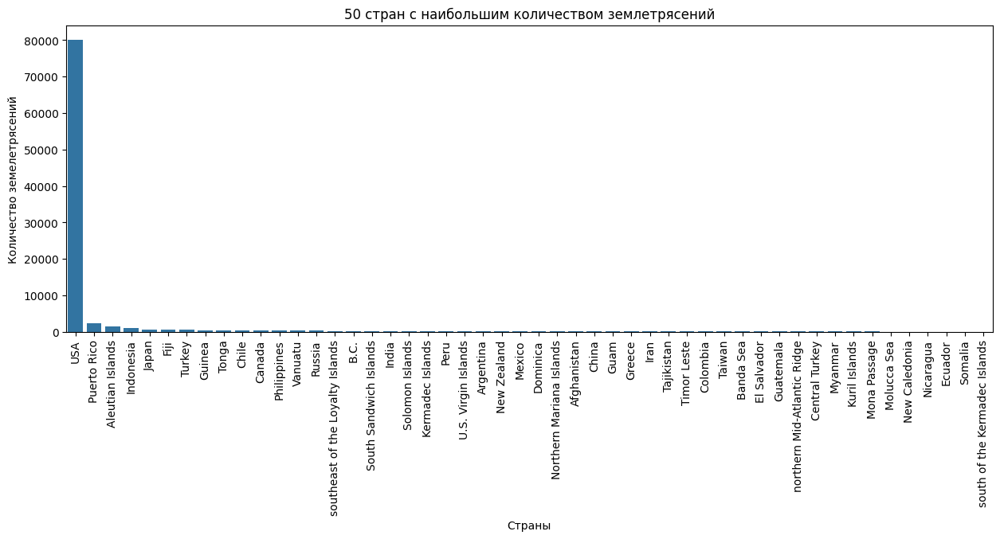

In [24]:
# подсчёт количества землетрясений в странах
counts = df['country'].value_counts()

# отображение первых 50 стран
plt.figure(figsize=(15, 5))
sns.barplot(x=counts.head(50).index, y=counts.head(50).values)
plt.xlabel('Страны')
plt.ylabel('Количество земелетрясений')
plt.title('50 стран с наибольшим количеством землетрясений')
plt.xticks(rotation=90)
plt.show()


Из-за большого количества земтретрясений в USA, для анализа посмотрим страны без USA.

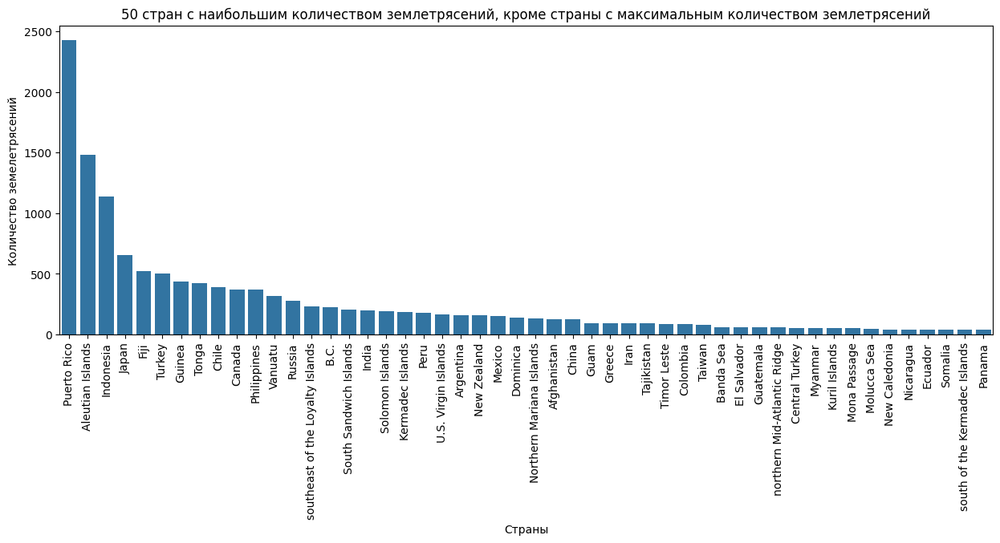

In [25]:
# отображение первых 50 стран, кроме USA
plt.figure(figsize=(15, 5))
sns.barplot(x=counts.iloc[1:51].index, y=counts.iloc[1:51].values)
plt.xlabel('Страны')
plt.ylabel('Количество земелетрясений')
plt.title('50 стран с наибольшим количеством землетрясений, кроме страны с максимальным количеством землетрясений')
plt.xticks(rotation=90)
plt.show()

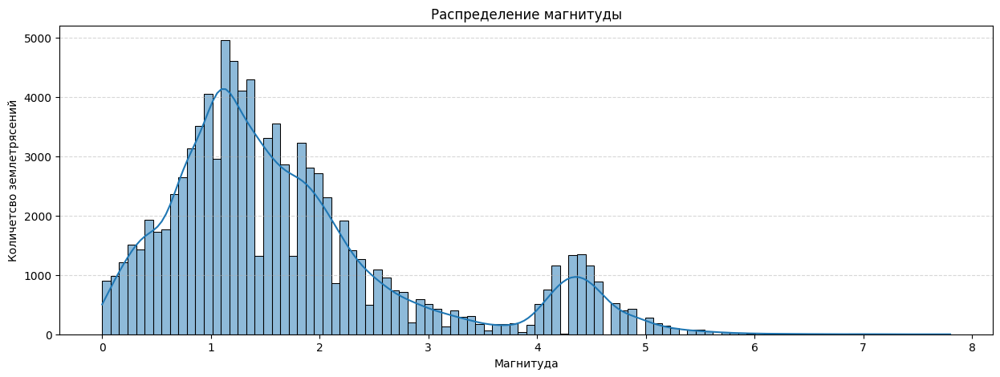

In [26]:
# просмотрим распределения магнитуды
plt.figure(figsize=(15, 5))
sns.histplot(data=df, x='magnitude', kde=True, bins=100, edgecolor='black')
plt.title('Распределение магнитуды')
plt.xlabel('Магнитуда')
plt.ylabel('Количетсво землетрясений')
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()


In [27]:
def get_bins_magnitude(data: int) -> str:
    """
    Генерация бинов для землетрясений"
    """
    if isinstance(data, (int, float)):
        if data <= 3:
            return 'green'
        elif 3 < data <= 5:
            return 'orange'
        elif data > 5:
            return 'red'

In [28]:
# генерация бинов, для будущей отрисовки прогноза на карте
df['magnitude_bins'] = df['magnitude'].apply(get_bins_magnitude)

In [29]:
# разделение datetime64[ns] по столбцам для будущего обучения моделей
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['day'] = df['datetime'].dt.day
df['hour'] = df['datetime'].dt.hour
df['minute'] = df['datetime'].dt.minute
df['second'] = df['datetime'].dt.second

In [30]:
# Сохранение DataFrame df в файл data/df.csv
df.to_csv('../data/df.csv', index=False)

In [31]:
df.shape

(94354, 20)